***Projet Traitement statistique des données et datamining ~ Bienfait MAMBOTE KIDIELA - Marc KPATCHA MASSABALO - Hakima ACHAK***

**Analyse des données des jeux Olympiques**

**------PARTIE I : PRE TRAITEMENT---------------------**

Nous sommes dans le phase de prétraitement.
Elle comprend les étapes de nettoyage, intégration,réduction, transformation

**Importation des bibliothèques**




In [ ]:
!pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=36eb36e108d4e655e345df3c596f0f77f40fcfdaedfb9991d6c16fa766d00055
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
pip install plotly


In [ ]:
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


from ydata_profiling import ProfileReport






In [ ]:
drive.mount("/content/drive")
dataset = pd.read_csv("/content/drive/MyDrive/datamining/dataset_olympics.csv")
dataset.head()#permet d'afficher les 5 premières lignes du dataset

Mounted at /content/drive


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


**Affichage des infos sur le fichier**

In [ ]:
dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      70000 non-null  int64  
 1   Name    70000 non-null  object 
 2   Sex     70000 non-null  object 
 3   Age     67268 non-null  float64
 4   Height  53746 non-null  float64
 5   Weight  52899 non-null  float64
 6   Team    70000 non-null  object 
 7   NOC     70000 non-null  object 
 8   Games   70000 non-null  object 
 9   Year    70000 non-null  int64  
 10  Season  70000 non-null  object 
 11  City    70000 non-null  object 
 12  Sport   70000 non-null  object 
 13  Event   70000 non-null  object 
 14  Medal   9690 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 8.0+ MB


**-----------------------------------------------I.1 . NETTOYAGE ( DATA CLEANING)----------------------------------------**



**Utilisation de y_data pour toutes les infos**

In [ ]:
report = ProfileReport(dataset, minimal=True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**---------------------------A)Affichage des données

---

manquantes----------------------**


In [ ]:
missing_percentage = (dataset.isnull().sum() / len(dataset)) * 100
print(missing_percentage)


ID         0.000000
Name       0.000000
Sex        0.000000
Age        3.902857
Height    23.220000
Weight    24.430000
Team       0.000000
NOC        0.000000
Games      0.000000
Year       0.000000
Season     0.000000
City       0.000000
Sport      0.000000
Event      0.000000
Medal     86.157143
dtype: float64


Verifier la co-occurence des données manquantes entre Height et Weight

In [ ]:
dataset[(dataset.Height.isna() & ~dataset.Weight.isna()) | (~dataset.Height.isna() & dataset.Weight.isna())]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
27,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 4 x 100 metres Relay,NaN
79,21,Ragnhild Margrethe Aamodt,F,27.0,163.0,NaN,Norway,NOR,2008 Summer,2008,Summer,Beijing,Handball,Handball Women's Handball,Gold
134,48,Abdelhak Aatakni,M,24.0,NaN,64.0,Morocco,MAR,2012 Summer,2012,Summer,London,Boxing,Boxing Men's Light-Welterweight,NaN
238,116,Hosni Mohamed Abbas,M,28.0,NaN,60.0,United Arab Republic,UAR,1960 Summer,1960,Summer,Roma,Weightlifting,Weightlifting Men's Featherweight,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69800,35549,Naomi-Lee Fischer-Rasmussen,F,28.0,176.0,NaN,Australia,AUS,2012 Summer,2012,Summer,London,Boxing,Boxing Women's Middleweight,NaN
69826,35558,Frantiek Fier,M,NaN,NaN,97.0,Czechoslovakia,TCH,1924 Summer,1924,Summer,Paris,Weightlifting,Weightlifting Men's Heavyweight,NaN
69831,35562,George Winthrop Fish,M,25.0,173.0,NaN,United States,USA,1920 Summer,1920,Summer,Antwerpen,Rugby,Rugby Men's Rugby,Gold
69882,35597,"George Foster Fiske, Jr.",M,28.0,177.0,NaN,United States,USA,1920 Summer,1920,Summer,Antwerpen,Shooting,"Shooting Men's Free Pistol, 50 metres",NaN


In [ ]:
# Nombre total de lignes dans le dataset
total_rows = len(dataset)

# Lignes où 'Height' est manquant mais pas 'Weight'
height_missing = dataset[dataset.Height.isna() & ~dataset.Weight.isna()]

# Lignes où 'Weight' est manquant mais pas 'Height'
weight_missing = dataset[~dataset.Height.isna() & dataset.Weight.isna()]

# Lignes où les deux, 'Height' et 'Weight', sont manquants
both_missing = dataset[dataset.Height.isna() & dataset.Weight.isna()]

# Calcul des pourcentages
percent_height_missing = (len(height_missing) / total_rows) * 100
percent_weight_missing = (len(weight_missing) / total_rows) * 100
percent_both_missing = (len(both_missing) / total_rows) * 100

# ----Identification de la probabilté que l'un implique l'autre------

# 1) Identifier les lignes où 'Height' est manquant et faire de meme pour weight

height_missing_whatever = dataset[dataset['Height'].isna()]
weight_missing_whatever = dataset[dataset['Weight'].isna()]


# 3): Calculer le pourcentage
percentage = (len(both_missing) / len(height_missing_whatever)) * 100
percentage2 = (len(both_missing) / len(weight_missing_whatever)) * 100
# Affichage du pourcentage
print(f"Parmi les lignes avec 'Height' manquant, {percentage:.2f}% ont également 'Weight' manquant.")
print(f"Parmi les lignes avec 'Weight' manquant, {percentage:.2f}% ont également 'Height' manquant.")

# Affichage des pourcentages
print(f"Pourcentage de lignes avec 'Height' manquant uniquement : {percent_height_missing:.2f}%")
print(f"Pourcentage de lignes avec 'Weight' manquant uniquement : {percent_weight_missing:.2f}%")
print(f"Pourcentage de lignes avec les deux 'Height' et 'Weight' manquants : {percent_both_missing:.2f}%")


Parmi les lignes avec 'Height' manquant, 97.68% ont également 'Weight' manquant.
Parmi les lignes avec 'Weight' manquant, 97.68% ont également 'Height' manquant.
Pourcentage de lignes avec 'Height' manquant uniquement : 0.54%
Pourcentage de lignes avec 'Weight' manquant uniquement : 1.75%
Pourcentage de lignes avec les deux 'Height' et 'Weight' manquants : 22.68%


In [ ]:
# Affichage des lignes avec données manquantes dans les colonnes 'Height' et 'Weight'
missing_data_rows = dataset[dataset['Height'].isnull() | dataset['Weight'].isnull()]

# Affichage des en-têtes et des lignes avec données manquantes
display(missing_data_rows)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
27,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 4 x 100 metres Relay,NaN
29,10,"Einar Ferdinand ""Einari"" Aalto",M,26.0,NaN,NaN,Finland,FIN,1952 Summer,1952,Summer,Helsinki,Swimming,Swimming Men's 400 metres Freestyle,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69975,35645,Roger Berkeley Fitzhardinge,M,33.0,NaN,NaN,Sydney Rowing Club,ANZ,1912 Summer,1912,Summer,Stockholm,Rowing,Rowing Men's Coxed Eights,NaN
69977,35647,"James Paul ""Jim"" Fitzpatrick",M,27.0,NaN,NaN,United States,USA,1920 Summer,1920,Summer,Antwerpen,Rugby,Rugby Men's Rugby,Gold
69994,35656,Stuart Fitzsimmons,M,19.0,NaN,NaN,Great Britain,GBR,1976 Winter,1976,Winter,Innsbruck,Alpine Skiing,Alpine Skiing Men's Downhill,NaN
69995,35656,Stuart Fitzsimmons,M,19.0,NaN,NaN,Great Britain,GBR,1976 Winter,1976,Winter,Innsbruck,Alpine Skiing,Alpine Skiing Men's Giant Slalom,NaN



**Utilisation du diagramme en mosaïque pour visualiser la corrélation entre les données manquantes des deux variables.**



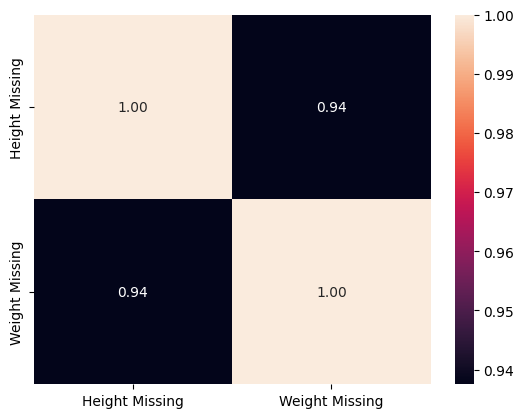

In [ ]:
#import matplotlib.pyplot as plt

# Créer un nouveau DataFrame indiquant la présence/absence de données
df_missing = dataset[['Height', 'Weight']].isna().astype(int).rename(columns={'Height': 'Height Missing', 'Weight': 'Weight Missing'})

# Utiliser seaborn pour créer un heatmap de corrélation
sns.heatmap(df_missing.corr(), annot=True, fmt=".2f")

# Afficher le graphique
plt.show()


**Trouver les années qui contiennent des vides dans les colonnes Height et Weight**



In [ ]:

# Grouper par 'Year' et compter le nombre total de lignes pour chaque année dans le dataset original
total_counts_per_year = dataset.groupby('Year').size()

# Grouper par 'Year' et compter le nombre de lignes avec des données manquantes pour 'Height' ou 'Weight'
missing_data_counts_per_year = missing_data_rows.groupby('Year').size()

# Calculer la proportion des valeurs manquantes par année
missing_proportions = (missing_data_counts_per_year / total_counts_per_year) * 100

# Afficher les proportions des valeurs manquantes par année
display(missing_proportions)



# Si votre dataset a des années sous forme de nombre entier, vous pouvez directement utiliser min() et max() sur la colonne 'Year'
min_year_with_missing_data = missing_data_rows['Year'].min()
max_year_with_missing_data = missing_data_rows['Year'].max()

# Afficher l'année minimale et maximale avec des données manquantes
print(f"L'année minimale avec des données manquantes est : {min_year_with_missing_data}")
print(f"L'année maximale avec des données manquantes est : {max_year_with_missing_data}")

Year
1896    75.384615
1900    97.939778
1904    91.233766
1906    89.791183
1908    88.439306
1912    85.951220
1920    90.968801
1924    90.880304
1928    88.702929
1932    86.870897
1936    90.864865
1948    86.765409
1952    80.482815
1956    62.337662
1960    13.057453
1964     8.908781
1968     1.785064
1972     4.251145
1976     8.272859
1980     7.869401
1984     6.156300
1988     7.978311
1992    20.617816
1994     4.599212
1996    14.396329
1998     2.339181
2000     1.134752
2002     1.616379
2004     0.524934
2006     0.098619
2008     1.923629
2010     0.332594
2012     2.961208
2014     4.096171
2016     2.095238
dtype: float64

L'année minimale avec des données manquantes est : 1896
L'année maximale avec des données manquantes est : 2016


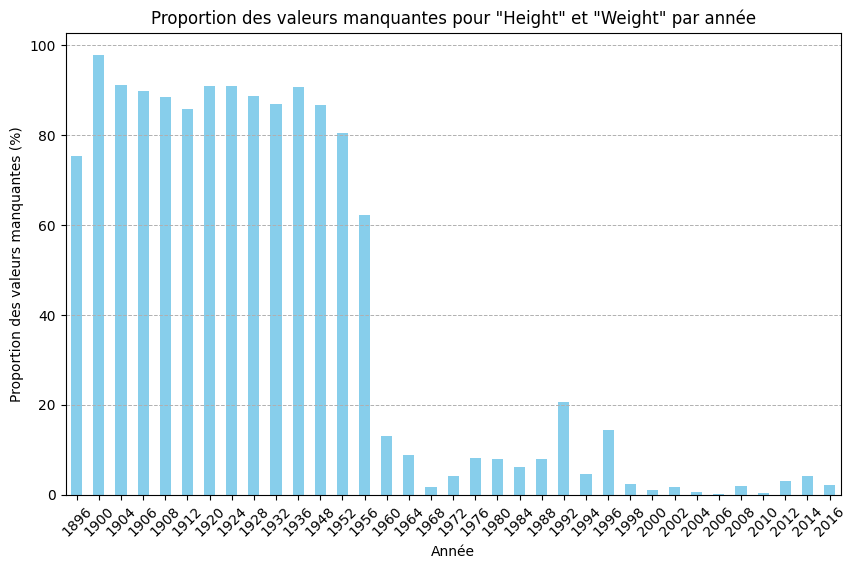

In [ ]:

# Création du graphique à barres
plt.figure(figsize=(10, 6))  # Ajustez la taille du graphique selon vos besoins
missing_proportions.plot(kind='bar', color='skyblue')

plt.title('Proportion des valeurs manquantes pour "Height" et "Weight" par année')
plt.xlabel('Année')
plt.ylabel('Proportion des valeurs manquantes (%)')
plt.xticks(rotation=45)  # Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Ajout d'une grille horizontale pour la lisibilité

# Afficher le graphique
plt.show()


**2. Pour la colonne Age**

In [ ]:
# Affichage des lignes avec données manquantes dans la colonne Age
missing_data_rows2 = dataset[dataset['Age'].isnull()]

# Affichage des en-têtes et des lignes avec données manquantes
display(missing_data_rows)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
27,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 4 x 100 metres Relay,NaN
29,10,"Einar Ferdinand ""Einari"" Aalto",M,26.0,NaN,NaN,Finland,FIN,1952 Summer,1952,Summer,Helsinki,Swimming,Swimming Men's 400 metres Freestyle,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69975,35645,Roger Berkeley Fitzhardinge,M,33.0,NaN,NaN,Sydney Rowing Club,ANZ,1912 Summer,1912,Summer,Stockholm,Rowing,Rowing Men's Coxed Eights,NaN
69977,35647,"James Paul ""Jim"" Fitzpatrick",M,27.0,NaN,NaN,United States,USA,1920 Summer,1920,Summer,Antwerpen,Rugby,Rugby Men's Rugby,Gold
69994,35656,Stuart Fitzsimmons,M,19.0,NaN,NaN,Great Britain,GBR,1976 Winter,1976,Winter,Innsbruck,Alpine Skiing,Alpine Skiing Men's Downhill,NaN
69995,35656,Stuart Fitzsimmons,M,19.0,NaN,NaN,Great Britain,GBR,1976 Winter,1976,Winter,Innsbruck,Alpine Skiing,Alpine Skiing Men's Giant Slalom,NaN


Year
1896    47.692308
1900    45.166403
1904    17.857143
1906    33.874710
1908    23.583815
1912     3.707317
1920    18.965517
1924    21.849272
1928    20.571827
1932     9.080963
1936     2.162162
1948    14.954611
1952     2.823241
1956    11.193568
1960     3.214142
1964     0.852515
1968     1.311475
1972     1.209941
1976     0.507983
1980     3.516116
1984     2.711324
1988     1.084431
1992     0.359195
1994          NaN
1996     0.028678
1998          NaN
2000          NaN
2002          NaN
2004          NaN
2006          NaN
2008     0.057422
2010          NaN
2012          NaN
2014          NaN
2016          NaN
dtype: float64

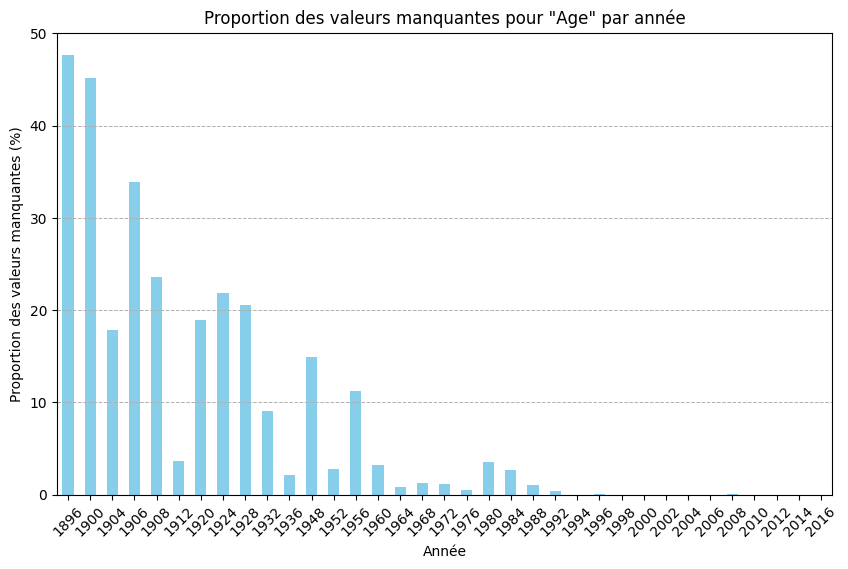

L'année minimale avec des données manquantes est : 1896
L'année maximale avec des données manquantes est : 2016


In [ ]:


# Grouper par 'Year' et compter le nombre de lignes avec des données manquantes pour 'Age'
missing_data_counts_per_year2 = missing_data_rows2.groupby('Year').size()

# Calculer la proportion des valeurs manquantes par année
missing_proportions2 = (missing_data_counts_per_year2 / total_counts_per_year) * 100

# Afficher les proportions des valeurs manquantes par année
display(missing_proportions2)

# Création du graphique à barres
plt.figure(figsize=(10, 6))  # Ajustez la taille du graphique selon vos besoins
missing_proportions2.plot(kind='bar', color='skyblue')

plt.title('Proportion des valeurs manquantes pour "Age" par année')
plt.xlabel('Année')
plt.ylabel('Proportion des valeurs manquantes (%)')
plt.xticks(rotation=45)  # Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Ajout d'une grille horizontale pour la lisibilité

# Afficher le graphique
plt.show()




# Si votre dataset a des années sous forme de nombre entier, vous pouvez directement utiliser min() et max() sur la colonne 'Year'
min_year_with_missing_data = missing_data_rows['Year'].min()
max_year_with_missing_data = missing_data_rows['Year'].max()

# Afficher l'année minimale et maximale avec des données manquantes
print(f"L'année minimale avec des données manquantes est : {min_year_with_missing_data}")
print(f"L'année maximale avec des données manquantes est : {max_year_with_missing_data}")

**----------------------------------B) Déterminer des doublons--------------------------------**

In [ ]:
# Retourne True pour les lignes qui sont des duplicatas, False autrement
duplicates = dataset.duplicated()

# Afficher le nombre de lignes dupliquées
print(f"Nombre de lignes dupliquées : {duplicates.sum()}")


Nombre de lignes dupliquées : 383


In [ ]:
# Afficher les lignes dupliquées
display(dataset[duplicates])


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
1252,704,Dsir Antoine Acket,M,27.0,NaN,NaN,Belgium,BEL,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",NaN
4282,2449,William Truman Aldrich,M,48.0,NaN,NaN,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",NaN
4283,2449,William Truman Aldrich,M,48.0,NaN,NaN,United States,USA,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Painting, Drawings And ...",NaN
4862,2777,Hermann Reinhard Alker,M,43.0,NaN,NaN,Germany,GER,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Architecture, Designs F...",NaN
4864,2777,Hermann Reinhard Alker,M,43.0,NaN,NaN,Germany,GER,1928 Summer,1928,Summer,Amsterdam,Art Competitions,"Art Competitions Mixed Architecture, Architect...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67774,34642,Clara Beatrice Fenton,F,45.0,NaN,NaN,United States,USA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Sculpturing, Unknown Event",NaN
69050,35215,Pedro Figari Solari,M,71.0,NaN,NaN,Uruguay,URU,1932 Summer,1932,Summer,Los Angeles,Art Competitions,Art Competitions Mixed Unknown Event,NaN
69051,35215,Pedro Figari Solari,M,71.0,NaN,NaN,Uruguay,URU,1932 Summer,1932,Summer,Los Angeles,Art Competitions,Art Competitions Mixed Unknown Event,NaN
69052,35215,Pedro Figari Solari,M,71.0,NaN,NaN,Uruguay,URU,1932 Summer,1932,Summer,Los Angeles,Art Competitions,Art Competitions Mixed Unknown Event,NaN


In [ ]:
# Supprimer les lignes dupliquées et garder la première occurrence
dataset_clean = dataset.drop_duplicates()


**--------------------------C)Valeurs abérrantes--------------------------------**


**Verification des valeurs abérrantes dans la colonne âge**

In [ ]:
report_after_cleaning = ProfileReport(dataset_clean, minimal = True)
report_after_cleaning

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Affichage de l'âge minimale
df = dataset_clean[dataset_clean['Age'] == 11]
df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
43468,22411,Magdalena Cecilia Colledge,F,11.0,152.0,NaN,Great Britain,GBR,1932 Winter,1932,Winter,Lake Placid,Figure Skating,Figure Skating Women's Singles,NaN


In [ ]:
# Affichage de l'âge maximale
df_max = dataset_clean[dataset_clean['Age'] == 88]
df_max.head()


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
60861,31173,Thomas Cowperthwait Eakins,M,88.0,NaN,NaN,United States,USA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",NaN


**---------------------------------------------I.2.INTEGRATION ET TRANSFORMATION---------------------------------------------**

**I.2.1. Types des données**

In [ ]:
 # Transformation des colonnes sex et medal en category
dataset_clean = dataset_clean.astype({'Name' : 'category',
                          'Sex' :'category',
                          'Age' : 'Int64',
                          'Team' : 'category',
                          'NOC' : 'category',
                          'Games' :'category',
                          'Season' :'category',
                          'City':'category',
                          'Sport':'category',
                          'Event' : 'category',
                          'Medal': 'category'})
dataset_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 69617 entries, 0 to 69999
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   ID      69617 non-null  int64   
 1   Name    69617 non-null  category
 2   Sex     69617 non-null  category
 3   Age     66946 non-null  Int64   
 4   Height  53741 non-null  float64 
 5   Weight  52899 non-null  float64 
 6   Team    69617 non-null  category
 7   NOC     69617 non-null  category
 8   Games   69617 non-null  category
 9   Year    69617 non-null  int64   
 10  Season  69617 non-null  category
 11  City    69617 non-null  category
 12  Sport   69617 non-null  category
 13  Event   69617 non-null  category
 14  Medal   9686 non-null   category
dtypes: Int64(1), category(10), float64(2), int64(2)
memory usage: 5.7 MB


**I.2.2. Integration du fichier NOC**

Importation du fichier contenant les NOC et les pays associés

In [ ]:
noc = pd.read_csv("/content/drive/MyDrive/datamining/noc_region.csv")
noc = noc.rename(columns={'noc_region': 'NOC'})
noc.head()


,NOC,reg,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [ ]:
# Fusion
dataset_merged = dataset_clean.merge(noc, on='NOC', how='left')
dataset_merged = dataset_merged.rename(columns={'NOC':'Code Pays', 'reg':'Pays'})
dataset_merged.head()

,ID,Name,Sex,Age,Height,Weight,Team,Code Pays,Games,Year,Season,City,Sport,Event,Medal,Pays,notes
0,1,A Dijiang,M,24,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN


**I.2.3.Transformations des modalités pour le sexe**

In [ ]:
dataset_merged.Sex = dataset_merged.Sex.cat.rename_categories({'M': 'Homme', 'F': 'Femme'})


**I.2.4. Integration du fichier 'Countries by continents'**

In [ ]:
countries_continents = pd.read_csv("/content/drive/MyDrive/datamining/Countries by continents.csv")
countries_continents.rename(columns={'Country': 'Pays'}, inplace=True)
countries_continents['Pays'] = countries_continents['Pays'].replace('United States','USA')
countries_continents.head()

,Continent,Pays
0,Africa,Algeria
1,Africa,Angola
2,Africa,Benin
3,Africa,Botswana
4,Africa,Burkina


In [ ]:
#Fusion des datasets sur la colonne des pays
dataset_merged2 = dataset_merged.merge(countries_continents, on='Pays', how='left')
dataset_merged2.head()

,ID,Name,Sex,Age,Height,Weight,Team,Code Pays,Games,Year,Season,City,Sport,Event,Medal,Pays,notes,Continent
0,1,A Dijiang,Homme,24,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,Asia
1,2,A Lamusi,Homme,23,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,Asia
2,3,Gunnar Nielsen Aaby,Homme,24,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,Europe
3,4,Edgar Lindenau Aabye,Homme,34,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN,Europe
4,5,Christine Jacoba Aaftink,Femme,21,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN,Europe


In [ ]:
dataset_final = dataset_merged2.copy()
dataset_final.head()

,ID,Name,Sex,Age,Height,Weight,Team,Code Pays,Games,Year,Season,City,Sport,Event,Medal,Pays,notes,Continent
0,1,A Dijiang,Homme,24,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,Asia
1,2,A Lamusi,Homme,23,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,Asia
2,3,Gunnar Nielsen Aaby,Homme,24,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,Europe
3,4,Edgar Lindenau Aabye,Homme,34,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN,Europe
4,5,Christine Jacoba Aaftink,Femme,21,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN,Europe


**----------------------------------------------II. ANALYSE EXPLORATOIRE----------------------------------------**

Le but de cette partie est de ressortir les tendances dans notre jeux des données .

**--------------II.1. Analyse des partcipations des athlètes aux Jeux Olympiques-----------------------------------**

**II.1.1.Analyse des données en fonction des genres**

Nombre des femmes

In [ ]:
nombre_hommes = (dataset_final['Sex'] == 'Homme').sum()
nombre_femmes = (dataset_final['Sex'] == 'Femme').sum()
pourcentage_hommes_femmes = dataset_final['Sex'].value_counts(normalize=True) * 100

print(f"Nombre d'hommes : {nombre_hommes}")
print(f"Nombre de femmes : {nombre_femmes}")
print(f"Pourcentage d'hommes et de femmes : {pourcentage_hommes_femmes} % ")



Nombre d'hommes : 51531
Nombre de femmes : 18086
Pourcentage d'hommes et de femmes : Sex
Homme    74.020713
Femme    25.979287
Name: proportion, dtype: float64 % 


Proportion des femmes

In [ ]:
# Filtre  pour les femmes et hommes
femmes_par_annee = dataset_final[dataset_final['Sex'] == 'Femme'].groupby('Year').size()
hommes_par_annee = dataset_final[dataset_final['Sex'] == 'Homme'].groupby('Year').size()

# Compter le nombre total d'entrées par année
total_par_annee = dataset_final.groupby('Year').size()

# Calculer la proportion des femmes par année
proportion_femmes = (femmes_par_annee / total_par_annee) * 100
# Calculer la proportion des hommes par année
proportion_hommes = (hommes_par_annee / total_par_annee) * 100

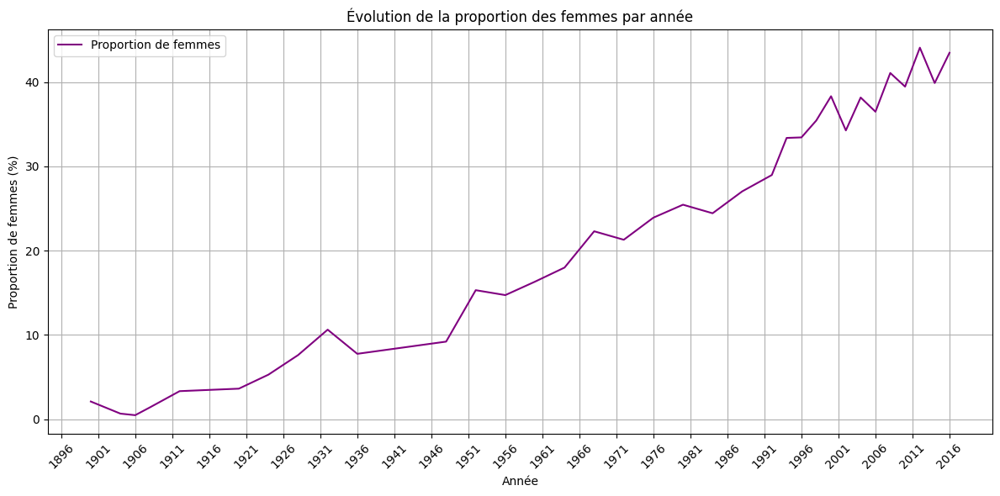

In [ ]:

plt.figure(figsize=(12, 6))  # Ajuster la taille du graphique
plt.plot(proportion_femmes.index, proportion_femmes, label='Proportion de femmes', color='purple')

plt.title('Évolution de la proportion des femmes par année')
plt.xlabel('Année')
plt.ylabel('Proportion de femmes (%)')
plt.legend()

# Rotation pour une meilleure lisibilité
plt.xticks(rotation=45)

# Générer des ticks pour l'axe des X avec un pas spécifique et s'assurer d'inclure l'année maximale
annee_min = proportion_femmes.index.min()
annee_max = proportion_femmes.index.max()
pas = 5  # Ou un autre pas selon le besoin

# Créer une liste de ticks de manière à inclure l'année maximale
ticks = list(range(annee_min, annee_max, pas)) + [annee_max]

plt.xticks(ticks)

plt.grid(True)
plt.tight_layout()
plt.show()



Evolution des femmes et hommes dans le temps

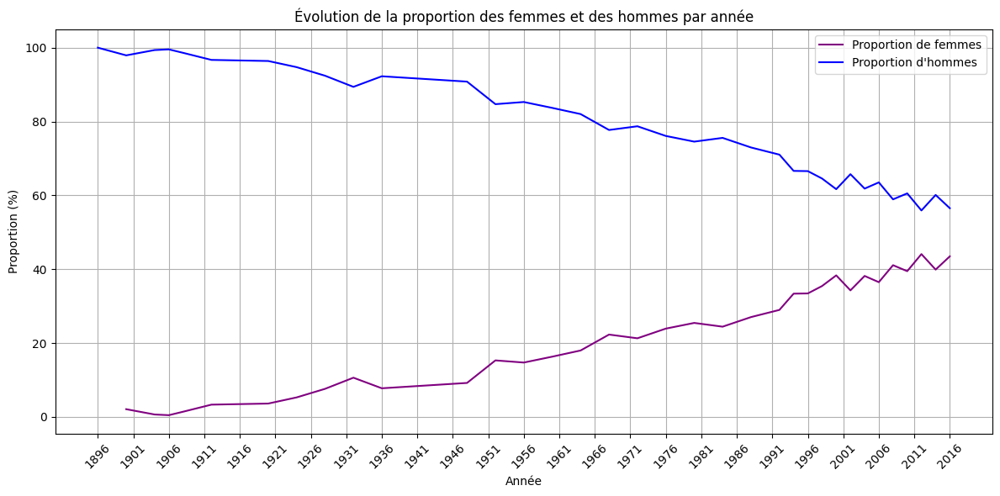

In [ ]:
plt.figure(figsize=(12, 6))

# Tracer la courbe des femmes
plt.plot(proportion_femmes.index, proportion_femmes, label='Proportion de femmes', color='purple')

# Tracer la courbe des hommes
plt.plot(proportion_hommes.index, proportion_hommes, label='Proportion d\'hommes', color='blue')

plt.title('Évolution de la proportion des femmes et des hommes par année')
plt.xlabel('Année')
plt.ylabel('Proportion (%)')
plt.legend()

# Définir les marques sur l'axe des X, incluant l'année maximale
annee_min = proportion_femmes.index.min()
annee_max = proportion_femmes.index.max()
pas = 5  # Adapter le pas selon le besoin et votre dataset
ticks = list(range(annee_min, annee_max, pas)) + [annee_max]

plt.xticks(ticks, rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


Repartion des athlètes par pays

In [ ]:
# Calculer le nombre total d'athlètes par pays
athletes_par_pays = dataset_final.groupby('Code Pays').size()

# Calculer le nombre total d'athlètes dans le dataset
total_athletes = len(dataset_final)

# Calculer la proportion des athlètes par pays
proportion_athletes_par_pays = (athletes_par_pays / total_athletes * 100).reset_index(name='ProportionAthletes')

# Trier le DataFrame par la colonne 'ProportionAthletes' en ordre décroissant
sorted_proportion_athletes_par_pays = proportion_athletes_par_pays.sort_values(by='ProportionAthletes', ascending=False)

# Afficher le DataFrame trié
print(sorted_proportion_athletes_par_pays)


# Calcul de la somme des proportions
#somme_proportions = proportion_athletes_par_pays['ProportionAthletes'].sum()

#print(f"La somme des proportions est : {somme_proportions}%")



    Code Pays  ProportionAthletes
212       USA            7.373199
69        FRA            6.932215
100       ITA            5.979861
74        GBR            5.014580
36        CAN            3.823779
..        ...                 ...
209       UNK            0.001436
108       KIR            0.001436
33        BUR            0.001436
222       YMD            0.001436
204       TUV            0.001436

[226 rows x 2 columns]


In [ ]:

# Carte pour la proportion d'athlètes par pays
fig = px.choropleth(proportion_athletes_par_pays,
                    locations='Code Pays',  # Utilisez la colonne avec les codes ISO 3166-1 alpha-3
                    color='ProportionAthletes',  # Utiliser la proportion calculée des athlètes par pays
                    hover_name='Code Pays',  # Utiliser le code du pays pour les info-bulles
                    color_continuous_scale=px.colors.sequential.Plasma,  # Palette de couleurs
                    title='Proportion des athlètes par pays')  # Titre du graphique
fig.show()

Repartion des femmes et hommes par pays

In [ ]:

# Calculer le nombre total d'athlètes par sexe et par pays
athletes_par_pays_et_sexe = dataset_final.groupby(['Code Pays', 'Sex']).size().unstack(fill_value=0)

# Ajouter des colonnes pour les proportions
#athletes_par_pays_et_sexe['Total'] = athletes_par_pays_et_sexe.sum(axis=1)
#athletes_par_pays_et_sexe['% Hommes'] = (athletes_par_pays_et_sexe['Homme'] / athletes_par_pays_et_sexe['Total']) * 100
#athletes_par_pays_et_sexe['% Femmes'] = (athletes_par_pays_et_sexe['Femme'] / athletes_par_pays_et_sexe['Total']) * 100

# Réinitialiser l'index pour que 'Code Pays' soit une colonne
athletes_par_pays_et_sexe.reset_index(inplace=True)



Carte pour le nombre des femmes par pays

In [ ]:
# Carte pour le nombre d'athlètes femmes par pays
fig_femmes_abs = px.choropleth(athletes_par_pays_et_sexe,
                               locations='Code Pays',
                               color='Femme',  # Utiliser le nombre absolu d'athlètes femmes
                               hover_name='Code Pays',
                               hover_data={'Femme': True, 'Homme': True},  # Afficher les nombres absolus dans l'info-bulle
                               color_continuous_scale=px.colors.sequential.Plasma,
                               title='Nombre de participations feminines par pays')
fig_femmes_abs.show()

Carte pour les hommes

In [ ]:
# Carte pour le nombre d'athlètes hommes par pays
fig_hommes_abs = px.choropleth(athletes_par_pays_et_sexe,
                               locations='Code Pays',
                               color='Homme',  # Utiliser le nombre absolu d'athlètes hommes
                               hover_name='Code Pays',
                               hover_data={'Homme': True, 'Femme': True},  # Afficher les nombres absolus dans l'info-bulle
                               color_continuous_scale=px.colors.sequential.Viridis,
                               title='Nombre de participations masculines par pays')
fig_hommes_abs.show()


**II.1.2.Analyse des particpations par saison**

Nombre d'athlètes par saison

In [ ]:
# Préparation des données : compter le nombre d'athlètes par genre et par saison
data_count = dataset_final.groupby(['Season', 'Sex']).size().reset_index(name='Count')

# Création du diagramme en barres avec Plotly Express
fig = px.bar(data_count, x='Season', y='Count', color='Sex', barmode='group',
             title="Nombre d'athlètes Féminins et Masculins par Saison",
             labels={"Count": "Nombre d'athlètes", "Sex": "Genre", "Season": "Saison"})

# Afficher le graphique
fig.show()

Repartittions par pays

In [ ]:
# Jeux Olympiques d'été


# Filtrer pour les Jeux d'été
df_summer = dataset_final[dataset_final['Season'] == 'Summer']

# Groupement des données par pays et comptage des entrées
participation_pays = df_summer.groupby(['Code Pays','Pays']).size().reset_index(name='Count')

# Filtrer pour éliminer les pays avec zéro participants
participation_pays = participation_pays[participation_pays['Count'] > 0]

# Création d'une carte choroplèthe pour les Jeux d'hiver
fig_summer = px.choropleth(participation_pays,
                           locations="Code Pays",
                           locationmode='ISO-3',  # Assumer que 'Code Pays' est le code pays ISO-3
                           color="Count",
                           hover_name="Pays",  # Afficher le code du pays lorsque l'on survole un pays
                           color_continuous_scale=px.colors.sequential.Plasma,
                           title="Participation aux Jeux Olympiques d'été par Pays",
                           )  # Définir la plage de couleurs pour exclure 0

fig_summer.show()


In [ ]:
# Jeux Olympiques d'hiver

# Filtrer pour les Jeux d'hiver
df_winter = dataset_final[dataset_final['Season'] == 'Winter']

# Groupement des données par pays et comptage des entrées
participation_pays = df_winter.groupby(['Code Pays','Pays']).size().reset_index(name='Count')

# Filtrer pour éliminer les pays avec zéro participants
participation_pays = participation_pays[participation_pays['Count'] > 0]

# Création d'une carte choroplèthe pour les Jeux d'hiver
fig_winter = px.choropleth(participation_pays,
                           locations="Code Pays",
                           locationmode='ISO-3',  # Assumer que 'Code Pays' est le code pays ISO-3
                           color="Count",
                           hover_name="Pays",  # Afficher le code du pays lorsque l'on survole un pays
                           color_continuous_scale=px.colors.sequential.Plasma,
                           title="Participation aux Jeux Olympiques d'Hiver par Pays",
                           )  # Définir la plage de couleurs pour exclure 0

fig_winter.show()

Evolution de la participation des femmes et des hommes dans les jeux Olympiques d'Eté

In [ ]:
import plotly.graph_objects as go

# Préparation des données pour la saison d'été
df_summer = dataset_final[dataset_final['Season'] == 'Summer'].groupby(['Year', 'Sex']).size().reset_index(name='Count')

# Séparation des données par sexe
df_summer_men = df_summer[df_summer['Sex'] == 'Homme']
df_summer_women = df_summer[df_summer['Sex'] == 'Femme']

# Création du graphique pour la saison d'été
fig_summer = go.Figure()

# Ajout de la ligne pour les hommes
fig_summer.add_trace(go.Scatter(x=df_summer_men['Year'], y=df_summer_men['Count'],
                                mode='lines+markers',
                                name='Hommes',
                                line=dict(color='blue')))

# Ajout de la ligne pour les femmes
fig_summer.add_trace(go.Scatter(x=df_summer_women['Year'], y=df_summer_women['Count'],
                                mode='lines+markers',
                                name='Femmes',
                                line=dict(color='pink')))

# Mise en forme du graphique
fig_summer.update_layout(title="Évolution de la participation par genre aux Jeux Olympiques d'Été",
                         xaxis_title='Année',
                         yaxis_title='Nombre de participations',
                         legend_title='Genre')

fig_summer.show()


Evolution de la participation des hommes et femmes dans les jeux olympiques d'hiver

In [ ]:
# Préparation des données pour la saison d'hiver
df_winter = dataset_final[dataset_final['Season'] == 'Winter'].groupby(['Year', 'Sex']).size().reset_index(name='Count')

# Séparation des données par sexe
df_winter_men = df_winter [df_winter['Sex'] == 'Homme']
df_winter_women = df_winter[df_winter['Sex'] == 'Femme']

# Création du graphique pour la saison d'hiver
fig_winter = go.Figure()

# Ajout de la ligne pour les hommes
fig_winter.add_trace(go.Scatter(x=df_winter_men['Year'], y=df_winter_men['Count'],
                                mode='lines+markers',
                                name='Hommes',
                                line=dict(color='blue')))

# Ajout de la ligne pour les femmes
fig_winter.add_trace(go.Scatter(x=df_winter_women['Year'], y=df_winter_women['Count'],
                                mode='lines+markers',
                                name='Femmes',
                                line=dict(color='pink')))

# Mise en forme du graphique
fig_winter.update_layout(title="Évolution de la participation par genre aux Jeux Olympiques d'Hiver",
                         xaxis_title='Année',
                         yaxis_title='Nombre de participations',
                         legend_title='Genre')

fig_winter.show()

**II.2.Analyse des performances des athlètes**

In [ ]:
#popular_sport = dataset['Sport'].value_counts()
#popular_sport

medal= dataset_final['Medal'].value_counts()
medal

Medal
Gold      3290
Bronze    3208
Silver    3188
Name: count, dtype: int64

Analyse des pays avec les plus de medailles


In [ ]:
# Filtrer les lignes où la colonne 'Medal' n'est pas NaN
medaled_df = dataset_final.dropna(subset=['Medal'])

# Grouper par 'NOC' et 'Medal', puis compter le nombre d'occurrences
medals_per_country = medaled_df.groupby(['Pays', 'Medal']).size().unstack(fill_value=0)

# Ajouter une colonne 'Total' pour le total des médailles
medals_per_country['Total'] = medals_per_country.sum(axis=1)

# Trier les pays par le total des médailles, en ordre décroissant
sorted_medals_per_country = medals_per_country.sort_values(by='Total', ascending=False)

# Afficher les pays avec le plus grand nombre de médailles
sorted_medals_per_country[['Gold', 'Silver', 'Bronze', 'Total']]

# Limiter le résultat aux 5 premiers pays
top_5_countries_medals = sorted_medals_per_country.head(5)

# Afficher les 5 pays avec le plus grand nombre de médailles
top_5_countries_medals[['Gold', 'Silver', 'Bronze', 'Total']]



Medal,Gold,Silver,Bronze,Total
Pays,,,,
USA,747,448,366,1561
Russia,315,232,247,794
Germany,261,246,249,756
France,184,216,257,657
Italy,217,193,194,604


Analyse des pays avec les moins de medailles

In [ ]:
# Trier les pays par le total des médailles, en ordre croissant
sorted_medals_per_country = medals_per_country.sort_values(by='Total', ascending=True)

# Limiter le résultat aux 5 derniers pays
bottom_5_countries_medals = sorted_medals_per_country.head(5)

# Afficher les 5 pays avec le moins de médailles
bottom_5_countries_medals[['Gold', 'Silver', 'Bronze', 'Total']]

Medal,Gold,Silver,Bronze,Total
Pays,,,,
Dominican Republic,1,0,0,1
Jordan,1,0,0,1
Iraq,0,0,1,1
Kyrgyzstan,0,1,0,1
Guyana,0,0,1,1


In [ ]:
# Grouper par 'Year', 'NOC' et 'Medal', puis compter le nombre d'occurrences
medals_per_country_year = medaled_df.groupby(['Year', 'Pays', 'Medal']).size().unstack(fill_value=0)

# Ajouter une colonne 'Total' pour le total des médailles par année et par pays
medals_per_country_year['Total'] = medals_per_country_year.sum(axis=1)

# Trier les résultats par 'Year' et 'Total' des médailles, en ordre décroissant
sorted_medals_per_country_year = medals_per_country_year.sort_values(by=['Year', 'Total'], ascending=[True, False])

# Vous pouvez afficher les résultats pour une année spécifique en filtrant, par exemple pour l'année 2016
sorted_medals_per_country_year.loc[2016]

# Ou afficher les résultats pour toutes les années
#sorted_medals_per_country_year

Medal,Bronze,Gold,Silver,Total
Pays,,,,
USA,22,49,14,85
UK,7,18,17,42
Italy,12,4,16,32
Australia,5,12,12,29
Russia,11,11,6,28
...,...,...,...,...
Trinidad,0,0,0,0
Uganda,0,0,0,0
United Arab Emirates,0,0,0,0


Medailles par sport et pays

In [ ]:


# Compter les médailles par pays et par sport
medal_counts = dataset_final.groupby(['Pays', 'Sport']).size().reset_index(name='Count')

# Calculer le total des médailles pour chaque pays
total_medals = dataset_final.groupby('Pays').size().reset_index(name='Total')

# Sélectionner les cinq premiers pays avec le plus de médailles
top_countries = total_medals.nlargest(5, 'Total')['Pays']

# Filtrer le dataset pour ne conserver que les données relatives aux cinq premiers pays
top_medal_counts = medal_counts[medal_counts['Pays'].isin(top_countries)]

# Créer le bubble chart pour ces pays et leurs sports
fig = px.scatter(top_medal_counts, x="Sport", y="Pays", size="Count", color="Count",
                 hover_name="Pays", size_max=60, title='Top 5 des pays avec le plus de médailles par sport')

# Afficher le bubble chart
fig.show()





Top 5 pays représentés visuellement

In [ ]:

# Créer un DataFrame pour le bubble chart, en fondant les trois types de médailles en une seule colonne
top_5_countries_melted = top_5_countries_medals.reset_index().melt(id_vars='Pays', value_vars=['Gold', 'Silver', 'Bronze'],
                                                                    var_name='Medal Type', value_name='Count')

# Créer le bubble chart
fig = px.scatter(top_5_countries_melted, x="Pays", y="Medal Type", size="Count", color="Medal Type",
                 hover_name="Pays", size_max=60, title='Top 5 des pays avec le plus de médailles par type')

# Afficher le bubble chart
fig.show()


**II.3. Analyse des sports**

In [ ]:
pd.set_option('display.max_rows', None)

sport =dataset_final['Sport'].value_counts()
display(sport)

Sport
Athletics                    10629
Gymnastics                    6248
Swimming                      5964
Fencing                       3096
Shooting                      3040
Cycling                       2788
Rowing                        2690
Alpine Skiing                 2326
Cross Country Skiing          2153
Football                      1959
Sailing                       1918
Wrestling                     1837
Equestrianism                 1827
Boxing                        1660
Hockey                        1507
Canoeing                      1455
Basketball                    1251
Speed Skating                 1238
Biathlon                      1198
Ice Hockey                    1181
Water Polo                    1030
Judo                          1030
Weightlifting                 1019
Handball                       913
Volleyball                     793
Bobsleigh                      793
Diving                         759
Tennis                         757
Art Competitio

Evolution des sports à travers les années

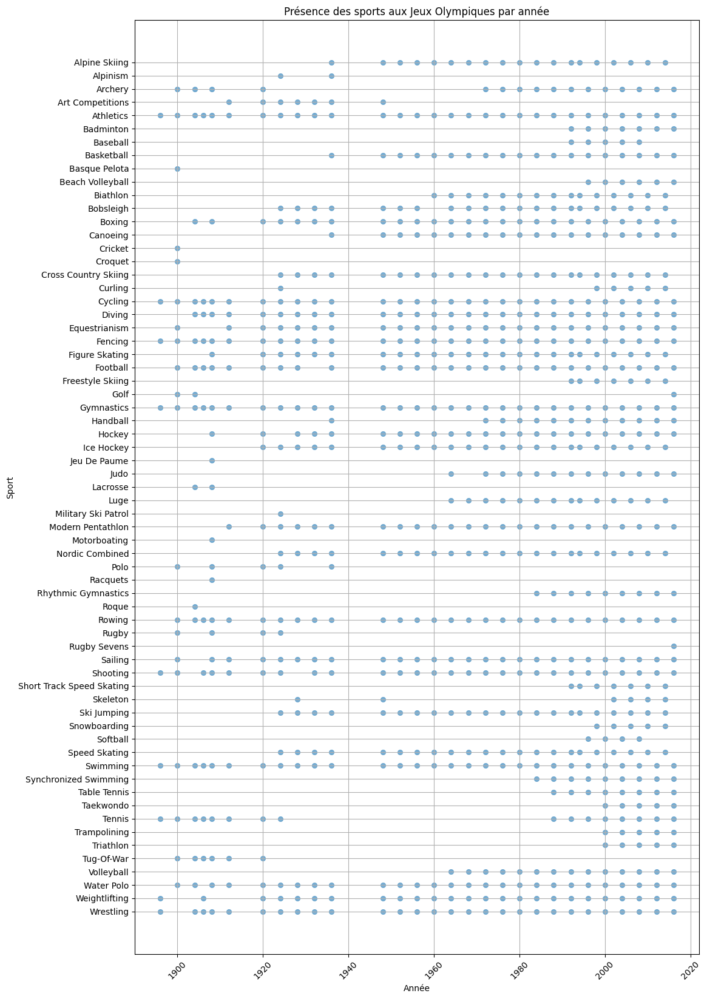

In [ ]:

# Préparation des données pour le scatter plot
# Nous utilisons 'drop_duplicates' pour éviter d'avoir des points superposés pour la même année et le même sport
data_for_plot = dataset_final[['Year', 'Sport']].drop_duplicates()

# Créer un scatter plot
plt.figure(figsize=(12, 20))
sns.scatterplot(data=data_for_plot, x='Year', y='Sport', alpha=0.6, edgecolor=None)

# Ajouter des détails au graphique
plt.title('Présence des sports aux Jeux Olympiques par année')
plt.xlabel('Année')
plt.ylabel('Sport')
plt.xticks(rotation=45)  # Rotation des labels de l'axe des x pour améliorer la lisibilité
plt.grid(True)  # Ajouter une grille pour faciliter la lecture des années

plt.show()

Popularité des sports par pays

In [ ]:


# Compter le nombre de participants pour chaque sport par pays

sports_count = dataset_final.groupby(['Pays', 'Sport']).size().unstack(fill_value=0)

# Identifier le sport le plus pratiqué dans chaque pays
# La fonction idxmax retourne l'index (dans ce cas, le sport) de la première occurrence du maximum dans chaque ligne
most_popular_sport = sports_count.idxmax(axis=1)

# Créer un DataFrame pour mieux visualiser les résultats
most_popular_sport_df = pd.DataFrame(most_popular_sport, columns=['Most Popular Sport'])

# Afficher les résultats
print(most_popular_sport_df)


                                    Most Popular Sport
Pays                                                  
Afghanistan                                  Wrestling
Albania                                  Weightlifting
Algeria                                      Athletics
American Samoa                           Weightlifting
Andorra                                  Alpine Skiing
Angola                                        Handball
Antigua                                      Athletics
Argentina                                    Athletics
Armenia                                  Weightlifting
Aruba                                        Athletics
Australia                                     Swimming
Austria                                  Alpine Skiing
Azerbaijan                                   Wrestling
Bahamas                                      Athletics
Bahrain                                      Athletics
Bangladesh                                   Athletics
Barbados  

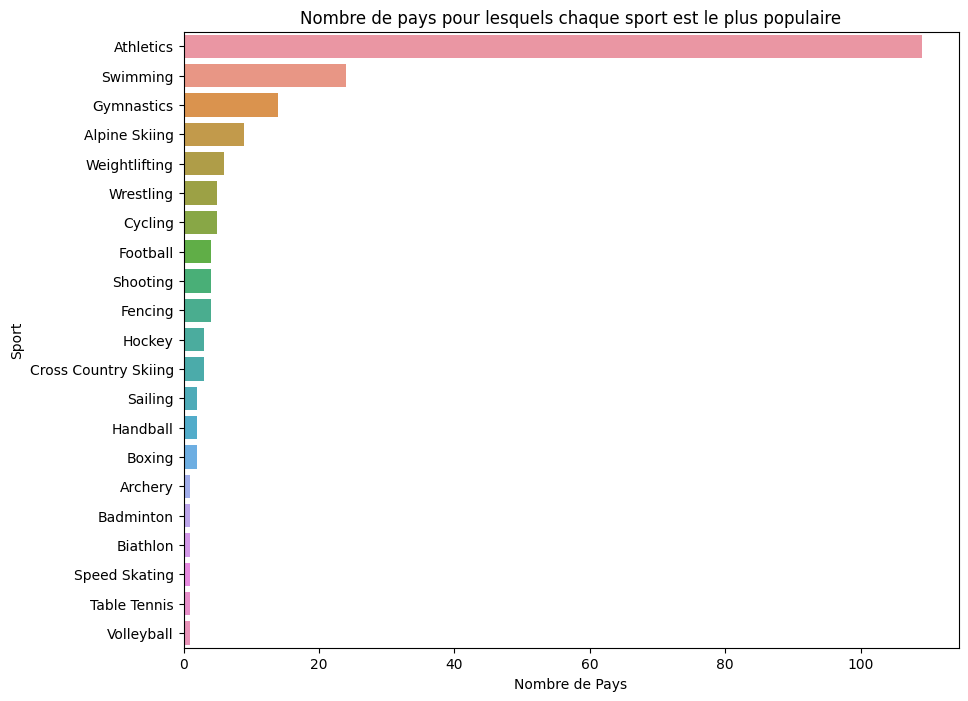

In [ ]:

# Pour un simple aperçu, on peut afficher le nombre de pays pour lesquels chaque sport est le plus populaire
popular_sport_frequency = most_popular_sport_df['Most Popular Sport'].value_counts()

plt.figure(figsize=(10, 8))
sns.barplot(x=popular_sport_frequency.values, y=popular_sport_frequency.index)
plt.title('Nombre de pays pour lesquels chaque sport est le plus populaire')
plt.xlabel('Nombre de Pays')
plt.ylabel('Sport')
plt.show()


Sport populaire pour chaque pays

In [ ]:
# Compter le nombre de participants pour chaque sport par pays
sports_count2 = dataset_final.groupby(['Pays', 'Sport']).size().reset_index(name='Count')

# Trouver le sport le plus populaire pour chaque pays en termes de nombre de participants
sports_count2 = sports_count2.sort_values('Count', ascending=False).drop_duplicates(['Pays'])

# Créer un treemap
fig = px.treemap(sports_count2, path=['Pays', 'Sport'], values='Count',
                 title='Pays et leur sport le plus populaire')

# Afficher le treemap
fig.show()

Sport populaire pour l'Europe

In [ ]:
# Filtrer les données pour ne conserver que les entrées relatives à l'Europe
european_data = dataset_final[dataset_final['Continent'] == 'Europe']

# Compter le nombre de participants pour chaque sport et chaque pays en Europe
european_sports_count = european_data.groupby(['Pays', 'Sport']).size().reset_index(name='Count')

# Trouver le sport le plus populaire pour chaque pays en Europe en termes de nombre de participants
# Nous trions d'abord par 'Pays' et 'Count' pour nous assurer que le sport le plus populaire arrive en premier pour chaque pays
european_sports_count = european_sports_count.sort_values(['Pays', 'Count'], ascending=[True, False])

# Enlever les sports moins populaires pour ne garder que le sport le plus populaire pour chaque pays
european_sports_count = european_sports_count.drop_duplicates(subset=['Pays'])

# Créer un treemap avec les sports les plus populaires par pays en Europe
fig = px.treemap(european_sports_count, path=['Pays', 'Sport'], values='Count',
                 title='Sports les plus populaires par pays en Europe')

# Afficher le treemap
fig.show()

Sport le plus populaire par pays africains

In [ ]:
# Filtrer les données pour ne conserver que les entrées relatives à l'Afrique
african_data = dataset_final[dataset_final['Continent'] == 'Africa']

# Compter le nombre de participants pour chaque sport et chaque pays en Afrique
African_sports_count = african_data.groupby(['Pays', 'Sport']).size().reset_index(name='Count')

# Trouver le sport le plus populaire pour chaque pays en Afrique en termes de nombre de participants
# Nous trions d'abord par 'Pays' et 'Count' pour nous assurer que le sport le plus populaire arrive en premier pour chaque pays
African_sports_count = African_sports_count.sort_values(['Pays', 'Count'], ascending=[True, False])

# Enlever les sports moins populaires pour ne garder que le sport le plus populaire pour chaque pays
African_sports_count = African_sports_count.drop_duplicates(subset=['Pays'])

# Créer un treemap avec les sports les plus populaires par pays en Afrique
fig = px.treemap(African_sports_count, path=['Pays', 'Sport'], values='Count',
                 title='Sports les plus populaires par pays en Afrique')

# Afficher le treemap
fig.show()

**------------------------III. ANALYSE PREDICTIVE------------------------------------**

Creation de notre base des données prédictives

Suppression des sports qui ne nous interessent pas

In [ ]:
# Liste des sports à exclure
sports_to_exclude = [
    'Art Competitions', 'Polo', 'Tug-Of-War', 'Lacrosse', 'Cricket',
    'Military Ski Patrol', 'Croquet', 'Alpinism', 'Racquets',
    'Motorboating', 'Roque', 'Jeu De Paume', 'Basque Pelota'
]

# Filtrer le DataFrame pour exclure les lignes contenant les sports mentionnés
dataset_pred = dataset_final[~dataset_final['Sport'].isin(sports_to_exclude)]



In [ ]:
# Vérifier que l'opération de filtrage a fonctionné correctement
assert all(sport not in dataset_pred['Sport'].unique() for sport in sports_to_exclude), "Error: Some sports were not excluded."

# Afficher les comptes de valeurs pour 'Sport' après la suppression
sport_counts = dataset_pred['Sport'].value_counts()

# Si vous voulez vraiment éliminer les index avec un décompte de 0, vous pouvez le faire explicitement :
sport_counts = sport_counts[sport_counts > 0]

print(sport_counts)

Sport
Athletics                    10629
Gymnastics                    6248
Swimming                      5964
Fencing                       3096
Shooting                      3040
Cycling                       2788
Rowing                        2690
Alpine Skiing                 2326
Cross Country Skiing          2153
Football                      1959
Sailing                       1918
Wrestling                     1837
Equestrianism                 1827
Boxing                        1660
Hockey                        1507
Canoeing                      1455
Basketball                    1251
Speed Skating                 1238
Biathlon                      1198
Ice Hockey                    1181
Judo                          1030
Water Polo                    1030
Weightlifting                 1019
Handball                       913
Volleyball                     793
Bobsleigh                      793
Diving                         759
Tennis                         757
Figure Skating

In [ ]:
report_pred = ProfileReport(dataset_pred, minimal=True)
report_pred

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#dataset_pred.to_csv(r'/content/drive/MyDrive/datamining/dataset_pred_olympics.csv', index=False)


**A) Correlation taille,poids et medailles**

-------Utilisation de la Dicretisation de la taille et du poids ----------

In [ ]:
df = dataset_pred.copy()

# Discrétisation de la taille
# Ajuster les bins en fonction de votre distribution de taille
bins_height = [120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230]
labels_height = ['120-129', '130-139', '140-149', '150-159', '160-169', '170-179', '180-189', '190-199', '200-209', '210-219', '220+']
df['Height_Bin'] = pd.cut(df['Height'], bins=bins_height, labels=labels_height, right=False,include_lowest=True)





In [ ]:
# Création d'une colonne cible pour les médailles (1 si médaille, 0 sinon)
df.loc[:,'Medal_Won'] = df.loc[:,'Medal'].notna().astype(int)

In [ ]:
# Discrétisation du poids
bins_weight = [20, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 215]
labels_weight = ['20-39', '40-49', '50-59', '60-69', '70-79', '80-89', '90-99', '100-109', '110-119', '120-129', '130-139', '140-149', '150-159', '160-169', '170-179', '180-189', '190-199', '200-214']

df['Weight_Bin'] = pd.cut(df['Weight'], bins=bins_weight, labels=labels_weight, right=False, include_lowest=True)

# Afficher le début du DataFrame pour vérifier
print(df[['Height', 'Height_Bin', 'Weight', 'Weight_Bin']].head())

   Height Height_Bin  Weight Weight_Bin
0   180.0    180-189    80.0      80-89
1   170.0    170-179    60.0      60-69
2     NaN        NaN     NaN        NaN
4   185.0    180-189    82.0      80-89
5   185.0    180-189    82.0      80-89


Segmentation par sexe

In [ ]:
# Séparation des données par sexe
df_males = df[df['Sex'] == 'Homme']
df_females = df[df['Sex'] == 'Femme']

Correlation pour les hommes

In [ ]:
# Analyse de la corrélation pour les hommes en utilisant les bins
print("Corrélation chez les hommes (bins):")
print(pd.crosstab(df_males['Height_Bin'], df_males['Medal_Won'], normalize='index'))
print(pd.crosstab(df_males['Weight_Bin'], df_males['Medal_Won'], normalize='index'))

# Visualisation avec des scatter plots pour les hommes
#sns.scatterplot(data=df_males, x='Height', y='Weight', hue='Medal_Won')
#plt.title('Relation entre taille et poids pour les athlètes masculins')
#plt.show()


Corrélation chez les hommes (bins):
Medal_Won          0         1
Height_Bin                    
130-139     1.000000  0.000000
140-149     0.615385  0.384615
150-159     0.882474  0.117526
160-169     0.910166  0.089834
170-179     0.891114  0.108886
180-189     0.856023  0.143977
190-199     0.797189  0.202811
200-209     0.726510  0.273490
210-219     0.735294  0.264706
220+        0.750000  0.250000
Medal_Won          0         1
Weight_Bin                    
40-49       0.854749  0.145251
50-59       0.897984  0.102016
60-69       0.918085  0.081915
70-79       0.877116  0.122884
80-89       0.838531  0.161469
90-99       0.801122  0.198878
100-109     0.768191  0.231809
110-119     0.839465  0.160535
120-129     0.815315  0.184685
130-139     0.834951  0.165049
140-149     0.714286  0.285714
150-159     0.733333  0.266667
160-169     0.600000  0.400000
170-179     0.000000  1.000000
200-214     1.000000  0.000000


Correlation pour les femmes

In [ ]:
# Analyse de la corrélation pour les femmes en utilisant les bins
print("Corrélation chez les femmes (bins):")
print(pd.crosstab(df_females['Height_Bin'], df_females['Medal_Won'], normalize='index'))
print(pd.crosstab(df_females['Weight_Bin'], df_females['Medal_Won'], normalize='index'))

# Visualisation avec des scatter plots pour les femmes
#sns.scatterplot(data=df_females, x='Height', y='Weight', hue='Medal_Won')
#plt.title('Relation entre taille et poids pour les athlètes féminins')
#plt.show()


Corrélation chez les femmes (bins):
Medal_Won          0         1
Height_Bin                    
120-129     1.000000  0.000000
130-139     0.864865  0.135135
140-149     0.896552  0.103448
150-159     0.907139  0.092861
160-169     0.880156  0.119844
170-179     0.818496  0.181504
180-189     0.768727  0.231273
190-199     0.701031  0.298969
200-209     0.538462  0.461538
210-219     1.000000  0.000000
Medal_Won          0         1
Weight_Bin                    
20-39       0.903955  0.096045
40-49       0.895740  0.104260
50-59       0.883938  0.116062
60-69       0.840926  0.159074
70-79       0.751685  0.248315
80-89       0.711864  0.288136
90-99       0.895833  0.104167
100-109     0.733333  0.266667
110-119     0.966667  0.033333
120-129     0.625000  0.375000
130-139     0.666667  0.333333


----------Utilisation des valeurs continues (pas des bins)------------

In [ ]:
# Création d'une colonne cible pour les médailles (1 si médaille, 0 sinon)
datased_pred = dataset_pred.copy()
dataset_pred.loc[:,'Medal_Won'] = dataset_pred.loc[:,'Medal'].notna().astype(int)


Analyse statistique pour vérifier la corrélation

In [ ]:
# Analyse statistique pour vérifier la corrélation
correlation_matrix = dataset_pred[['Height', 'Weight', 'Medal_Won']].corr()
correlation_matrix


,Height,Weight,Medal_Won
Height,1.000000,0.783299,0.089007
Weight,0.783299,1.000000,0.084483
Medal_Won,0.089007,0.084483,1.000000


Visualisation des données

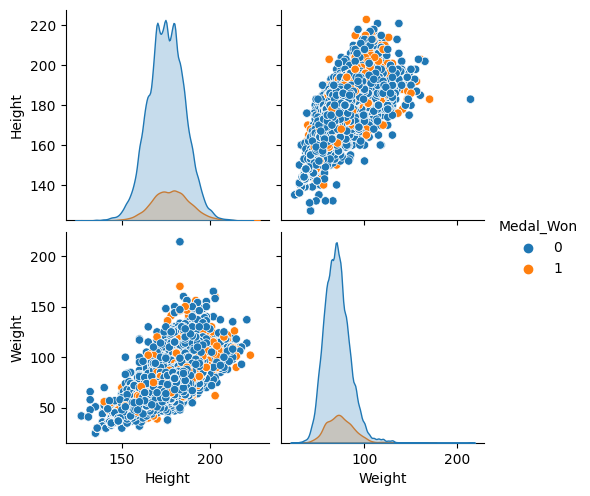

In [ ]:
# Pairplot pour visualiser la distribution des variables et leurs relations
sns.pairplot(dataset_pred[['Height', 'Weight', 'Medal_Won']], hue='Medal_Won')
plt.show()

Relation entre médailles et poids,taille pour chaque sport

In [ ]:

# Créer une nouvelle colonne pour indiquer si une médaille a été gagnée
dataset_pred.loc[:,'Medal_Won'] = dataset_pred.loc[:,'Medal'].notna().astype(int)

# Seuil de corrélation considéré comme fort
strong_correlation_threshold = 0.6 # A modifier

# Sélectionner les sports qui nous intéressent
sports_of_interest = dataset_pred['Sport'].unique()

# Pour chaque sport, faire des analyses
for sport in sports_of_interest:
    sport_df = dataset_pred[dataset_pred['Sport'] == sport]
    # Calculer la corrélation
    correlation_matrix = sport_df[['Height', 'Weight', 'Medal_Won']].corr()

    # Vérifier si la corrélation entre Height et Medal_Won OU Weight et Medal_Won est forte
    if (abs(correlation_matrix.loc['Height', 'Medal_Won']) > strong_correlation_threshold or
        abs(correlation_matrix.loc['Weight', 'Medal_Won']) > strong_correlation_threshold):
        # Afficher la corrélation si elle est forte
        print(f"Corrélation forte pour {sport}:\n", correlation_matrix)

        # Créer des scatter plots pour le sport
        sns.scatterplot(data=sport_df, x='Height', y='Weight', hue='Medal_Won')
        plt.title(f'Relation entre taille et poids pour les médaillés en {sport}')
        plt.show()


Predictions avec répartitions ds sexes

In [ ]:
data_males = dataset_pred[dataset_pred['Sex'] == 'Homme']
data_females = dataset_pred[dataset_pred['Sex'] == 'Femme']


Analyse des correlations par sexe

In [ ]:

def collect_significant_correlations(sport_df, sport, gender, correlations_dict):
    correlation_matrix = sport_df[['Height', 'Weight', 'Medal_Won']].corr()
    if abs(correlation_matrix.loc['Height', 'Medal_Won']) >= 0.5 or abs(correlation_matrix.loc['Weight', 'Medal_Won']) >= 0.5:
        correlations_dict[f"{gender} in {sport}"] = correlation_matrix

# Préparer le dictionnaire pour stocker les corrélations
significant_correlations = {}

# Liste des sports
sports = dataset_pred['Sport'].unique()

# Calcul et stockage des corrélations significatives
for sport in sports:
    sport_df_males = df_males[df_males['Sport'] == sport]
    sport_df_females = df_females[df_females['Sport'] == sport]
    collect_significant_correlations(sport_df_males, sport, 'Hommes', significant_correlations)
    collect_significant_correlations(sport_df_females, sport, 'Femmes', significant_correlations)




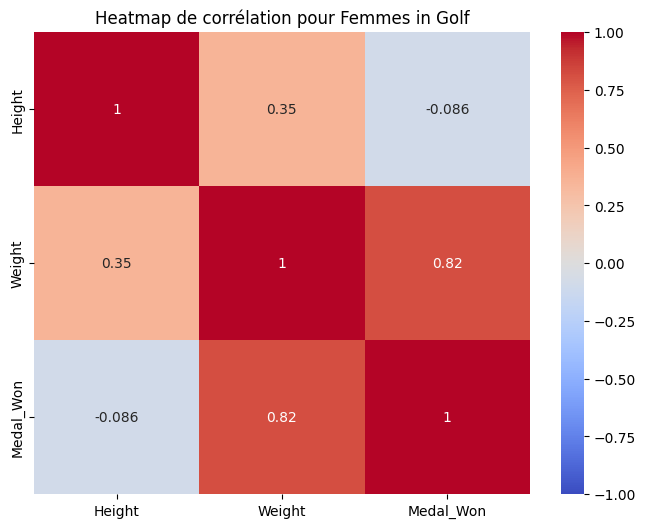

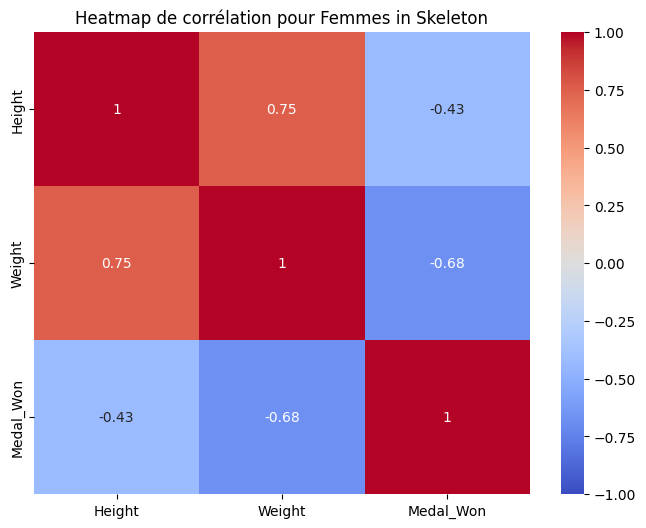

In [ ]:
# Visualiser les corrélations significatives avec des heatmaps
for title, matrix in significant_correlations.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f'Heatmap de corrélation pour {title}')
    plt.show()

Modèle de prédiction pour chaque sexe et chaque sport


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def train_predict_evaluate(sport_df, sport, gender):
    # Vérification des données suffisantes
    if sport_df.shape[0] > 50:  # S'assurer qu'il y a assez de données
        # Séparation des caractéristiques et de la cible
        X = sport_df[['Height', 'Weight']]
        y = sport_df['Medal_Won']

        # Séparation des données en ensembles d'entraînement et de test
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Création et entraînement du modèle
        model = LogisticRegression(solver='liblinear')  # Utilisation de 'liblinear' pour les petits datasets
        model.fit(X_train, y_train)

        # Prédiction sur l'ensemble de test
        predictions = model.predict(X_test)

        # Évaluation du modèle
        accuracy = accuracy_score(y_test, predictions)
        report = classification_report(y_test, predictions)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Affichage des résultats
        print(f"Résultats pour {gender} dans {sport}:")
        print(f"Accuracy: {accuracy}")
        print("Classification Report:")
        print(report)
        print("Confusion Matrix:")
        print(conf_matrix)
        print("\n")
    else:
        print(f"Not enough data to model {gender} in {sport}")

# Préparation du dictionnaire pour stocker les DataFrames avec des corrélations significatives
significant_data = {}

# Collecte des DataFrames à partir des corrélations significatives
for title, matrix in significant_correlations.items():
    sport, gender = title.split(" in ")
    if "Hommes" in gender:
        df_to_use = df_males[df_males['Sport'] == sport]
    else:
        df_to_use = df_females[df_females['Sport'] == sport]
    significant_data[title] = df_to_use

# Application du modèle pour chaque sous-ensemble pertinent
for title, df in significant_data.items():
    sport, gender = title.split(" in ")
    train_predict_evaluate(df, sport, gender)



Not enough data to model Golf in Femmes
Not enough data to model Skeleton in Femmes


In [ ]:
# Filtrer le DataFrame pour les femmes qui jouent au golf
df_females_golf = dataset_pred.loc[(dataset_pred['Sex'] == 'Femme') & (dataset_pred['Sport'] == 'Golf')]

# Afficher le début du DataFrame filtré pour vérifier
df_females_golf.head()

,ID,Name,Sex,Age,Height,Weight,Team,Code Pays,Games,Year,Season,City,Sport,Event,Medal,Pays,notes,Continent,Medal_Won
283,150,Margaret Ives Abbott (-Dunne),Femme,23,NaN,NaN,United States,USA,1900 Summer,1900,Summer,Paris,Golf,Golf Women's Individual,Gold,USA,NaN,North America,1
284,151,Mary Perkins Ives Abbott (Perkins-),Femme,42,NaN,NaN,United States,USA,1900 Summer,1900,Summer,Paris,Golf,Golf Women's Individual,NaN,USA,NaN,North America,0
10161,5562,Aditi Ashok,Femme,18,173.0,57.0,India,IND,2016 Summer,2016,Summer,Rio de Janeiro,Golf,Golf Women's Individual,NaN,India,NaN,Asia,0
17085,9175,Laetitia Beck,Femme,24,175.0,61.0,Israel,ISR,2016 Summer,2016,Summer,Rio de Janeiro,Golf,Golf Women's Individual,NaN,Israel,NaN,Asia,0
30374,15740,A. Brun,Femme,<NA>,NaN,NaN,France,FRA,1900 Summer,1900,Summer,Paris,Golf,Golf Women's Individual,NaN,France,NaN,Europe,0


**B) Analyse des performances passées des athlètes pour déterminer les futures**

Création  une colonne pour le nombre de médailles gagnées par année et par athlète :



In [ ]:
df_perf = dataset_pred.copy()
df_perf['Medal_Won'] = df_perf['Medal'].notna().astype(int)
df_perf['Medals_Count'] = df_perf.groupby(['ID', 'Year'])['Medal_Won'].transform('sum')


Identifier les athlètes participants aux Jeux successifs :



In [ ]:
df_perf['Next_Year'] = df_perf['Year'] + 4
df_perf['Future_Medal'] = df_perf.groupby('ID')['Medal_Won'].shift(-1)
df_perf['Future_Medals_Count'] = df_perf.groupby('ID')['Medals_Count'].shift(-1)


Analyse Statistique

In [ ]:
correlation_matrix = df_perf[['Medals_Count', 'Future_Medals_Count']].corr()
correlation_matrix


,Medals_Count,Future_Medals_Count
Medals_Count,1.000000,0.871792
Future_Medals_Count,0.871792,1.000000


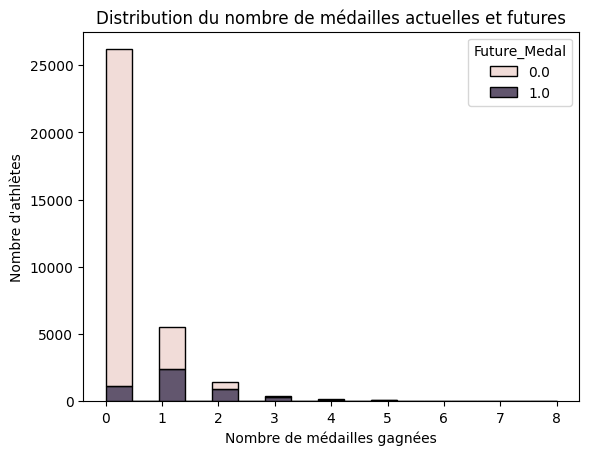

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histogramme conditionnel
sns.histplot(data=df_perf, x='Medals_Count', hue='Future_Medal', multiple='stack')
plt.title('Distribution du nombre de médailles actuelles et futures')
plt.xlabel('Nombre de médailles gagnées')
plt.ylabel('Nombre d\'athlètes')
plt.show()


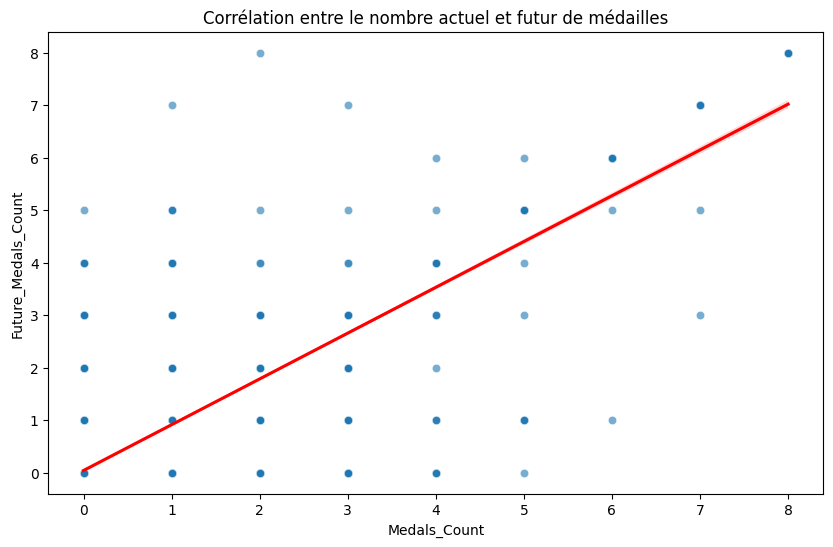

In [ ]:

# Affichage du nuage de points pour visualiser la relation
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_perf, x='Medals_Count', y='Future_Medals_Count', alpha=0.6)

# Mettre des titres et labels appropriés
plt.title('Corrélation entre le nombre actuel et futur de médailles')
plt.xlabel('Nombre de médailles actuelles')
plt.ylabel('Nombre de médailles futures')

# Ajouter une ligne de tendance
sns.regplot(data=df_perf, x='Medals_Count', y='Future_Medals_Count', scatter=False, color='r')

# Afficher le graphique
plt.show()


Construction d'un modèle predictif

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Filtrer les données pour les années où l'on sait si un athlète a participé aux jeux suivants
predictive_df = df_perf.dropna(subset=['Future_Medal'])

X = predictive_df[['Medals_Count']]
y = predictive_df['Future_Medal']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = LogisticRegression()
model.fit(X_train, y_train)

predictions = model.predict(X_test)
print(classification_report(y_test, predictions))


              precision    recall  f1-score   support

         0.0       0.89      0.97      0.93      8623
         1.0       0.66      0.29      0.40      1523

    accuracy                           0.87     10146
   macro avg       0.77      0.63      0.66     10146
weighted avg       0.85      0.87      0.85     10146

